<a href="https://colab.research.google.com/github/saleemhamo/computer-vision-text-line-segmentation/blob/main/Computer_Vision_Project_1_Line_Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Done By:

*   Saleem Hamo - 1170381
*   Mohammad Abbas - 1170011

# Drive Mounting, Importing Used Libraries and Reading Preporocessed Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install seam-carving

In [ ]:
import numpy as np
import cv2 as cv
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import pandas as pd
from PIL import Image
import seam_carving
import pandas as pd
import random
import statistics


# Defined Functions

Fix Skew (Line Orientation)

In [ ]:
def fix_skew(thresh):
  pts = cv.findNonZero(thresh)
  ret = cv.minAreaRect(pts)
  
  (cx,cy), (w,h), ang = ret
  if w>h:
      w,h = h,w
      ang += 90
  
  M = cv.getRotationMatrix2D((cx,cy), ang, 1.0)
  return cv.warpAffine(thresh, M, (thresh.shape[1], thresh.shape[0]))

def fix_skew2(thresh):
  pts = cv.findNonZero(thresh[0])
  ret = cv.minAreaRect(pts)
  
  (cx,cy), (w,h), ang = ret
  if w>h:
      w,h = h,w
      ang += 90
  
  M = cv.getRotationMatrix2D((cx,cy), ang, 1.0)
  return cv.warpAffine(thresh, M, (thresh.shape[1], thresh.shape[0]))

Thresholding

In [ ]:
def threshold(img, inv=False):
  mode = cv.THRESH_BINARY
  if inv:
    mode = cv.THRESH_BINARY_INV

  return cv.threshold(img, 0, 255,  mode + cv.THRESH_OTSU)[-1]

Draw White Space Between Lines

In [ ]:
def draw_white_space_between_lines(image, threshold_value_low=40000, threshold_value_high=40000, plot_histogram=False):
  h, w = image.shape[:2]
  gray = image.copy()
  thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

  # Sum white pixels in each row
  # Create blank space array and and final image 
  pixels = np.sum(thresh, axis=1).tolist()
  space = np.ones((1, w), dtype=np.uint8) * 255
  result = np.zeros((0, w), dtype=np.uint8)

  # Iterate through each row and add space if entire row is empty
  # otherwise add original section of image to final image
  for index, value in enumerate(pixels):
      if value > threshold_value_low and  value < threshold_value_high:
        result = np.concatenate((result, space), axis=0)
      else:
        row = gray[index:index+1, 0:w]
        result = np.concatenate((result, row), axis=0)

  #  plot visualization
  if (plot_histogram):
    x = range(len(pixels))[::-1]
    df = pd.DataFrame({'y': x, 'x': pixels})
    df.plot(x='x', y='y', xlim=(-2000,max(pixels) + 2000), legend=None, color='teal',figsize=(20,40))

  return result

Adding Equal Spaces Around Text

In [ ]:
def make_square(image_in):
    size = image_in.shape[:2]
    max_dim = max(size)
    delta_w = max_dim - size[1]
    delta_h = max_dim - size[0]
    top, bottom =  delta_h // 2, delta_h - (delta_h // 2)
    left, right =  delta_w // 2, delta_w - (delta_w // 2)
    color = [255, 255, 255]
    # image_out = cv2.copyMakeBorder(image_in, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)
    image_out = cv2.copyMakeBorder(image_in, top, bottom, left, right, cv2.BORDER_REPLICATE, value=color)
    return image_out

Seam Carving Function

In [ ]:
def seam_carve(thresh):
  src = np.array(thresh)
  src_h, src_w = src.shape[:2]
  dst = seam_carving.resize(
      src, (src_w, src_h + 700),
      energy_mode='forward',   # Choose from {backward, forward}
      order='height-first',  # Choose from {width-first, height-first}
      keep_mask=None
  )
  Image.fromarray(dst).show()

  return dst

Crop Image

In [ ]:
def crop_image(image):
  gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
  # gray = image.copy()[-1]
  gray = 255*(gray < 128).astype(np.uint8) # To invert the text to white
  coords = cv2.findNonZero(gray) # Find all non-zero points (text)
  x, y, w, h = cv2.boundingRect(coords) # Find minimum spanning bounding box
  rect = image[y:y+h, x:x+w] # Crop the image - note we do this on the original image
  return rect

Draw Upper and Lower Lines

In [ ]:
ALL_LINES = []

In [ ]:
def draw_lines(img, dst):
  thresh = img.copy()
  hp = cv.reduce(thresh, 1, cv.REDUCE_AVG).reshape(-1)

  # Exctract upper and lower bounds of connected lines of the document
  th = 2
  H,W = thresh.shape[:2]
  uppers = [y for y in range(H-1) if hp[y]<=th and hp[y+1]>th]
  lowers = [y for y in range(H-1) if hp[y]>th and hp[y+1]<=th]

  # Compute lines' heights
  lh = [lowers[i] - uppers[i] for i in range(min(len(lowers), len(uppers)))]

  # Extract lines with very small heights (i.e.: diacritical lines)
  q1 = np.average(lh) / 3
  small = [i for i in range(len(lh)) if lh[i] <= q1]

  # Filter out small lines
  for i in range(len(small)):
    uppers.pop(small[i] - i)
    lowers.pop(small[i] - i)

  # Compute lines' heights again without the small lines
  lh = [lowers[i] - uppers[i] for i in range(min(len(lowers), len(uppers)))]

  # Extract lines with very large heights (i.e.: two connected lines)
  q3 = int(np.average(lh) * 1.8)
  big = [i for i in range(len(lh)) if lh[i] >= q3]

  # Separate large lines into two
  for i in range(len(big)):
    mid = uppers[big[i]] + int((lowers[big[i]] - uppers[big[i]]) / 2)
    uppers.append(mid - 2)
    lowers.append(mid + 2)

  colored = cv.cvtColor(thresh, cv.COLOR_GRAY2BGR)


  # middle = []
  # for line_index in range(0, len(uppers)):
  #   middle.append(int((uppers[line_index]+lowers[line_index] )/ 2))
  # for y in middle:
  #     cv.line(colored, (0,y), (W, y), (255,0,0), 1)

  col_uppers = []  
  col_lowers = []

  for line_index in range(0, min(len(lowers), len(uppers))):
    if abs(uppers[line_index] - lowers[line_index]) > 40:
      cv.line(colored, (0,uppers[line_index]), (W, uppers[line_index]), (255,0,0), 1)
      cv.line(colored, (0,lowers[line_index]), (W, lowers[line_index]), (0,255,0), 1)
      cv.line(dst, (0,uppers[line_index]), (W, uppers[line_index]), (255,0,0), 1)
      cv.line(dst, (0,lowers[line_index]), (W, lowers[line_index]), (0,255,0), 1)
      col_uppers.append(uppers[line_index])
      col_lowers.append(lowers[line_index])

  ALL_LINES.append([col_uppers, col_lowers])
      
  
  # for y in uppers:
  #     cv.line(colored, (0,y), (W, y), (255,0,0), 1)

  # for y in lowers:
  #     cv.line(colored, (0,y), (W, y), (0,255,0), 1)

  thresh2 = cv.cvtColor(thresh, cv.COLOR_GRAY2BGR)

  return colored, dst

# First Approach: Horizontal Projection

Read Sample Image

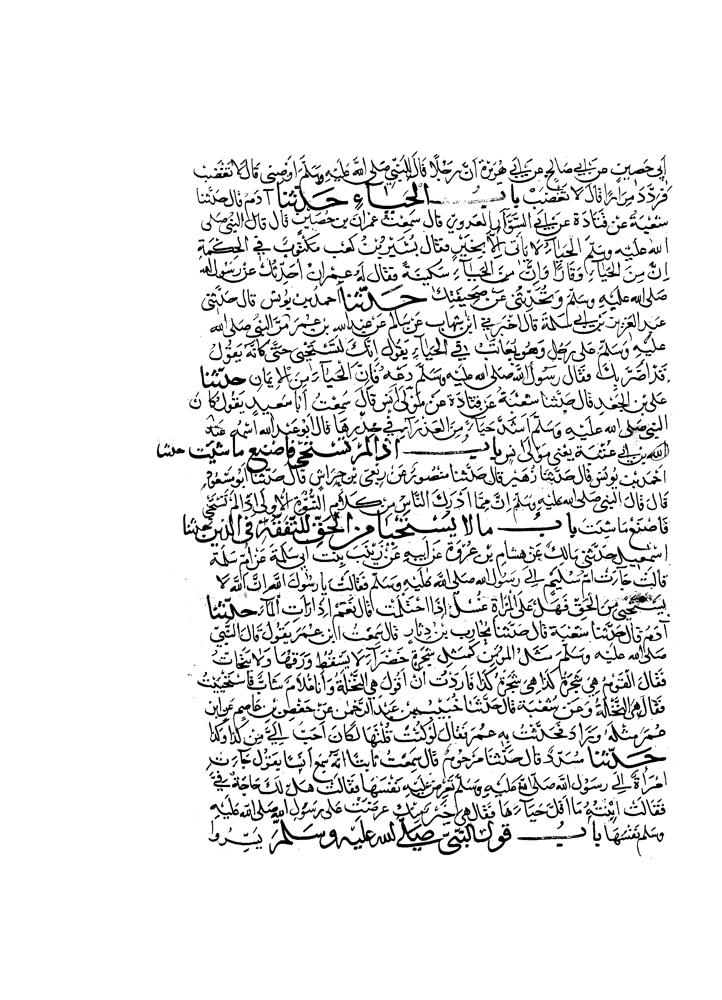

In [ ]:
FILE_NAME = '/content/drive/MyDrive/120 - 2nd Semester/Computer Vision/Project #1/Dataset/ahte_dataset/ahte_test_binary_images/moc_train_3.png'
img = cv.imread(FILE_NAME, cv.IMREAD_GRAYSCALE)


Thresholding

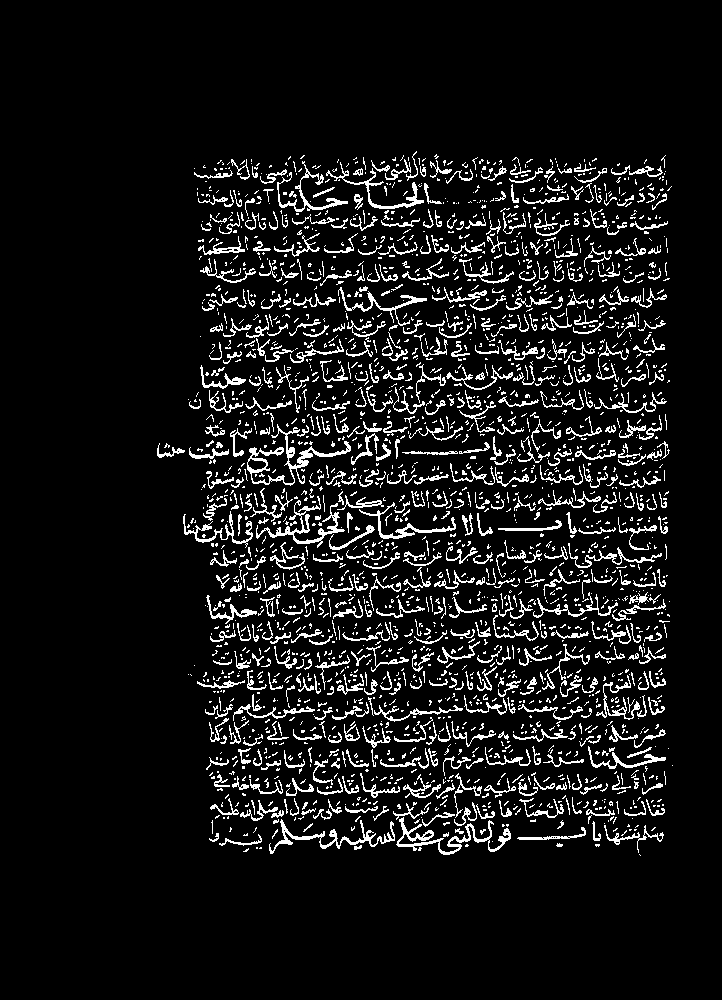

In [ ]:
thresh = threshold(img, True)


Erosion

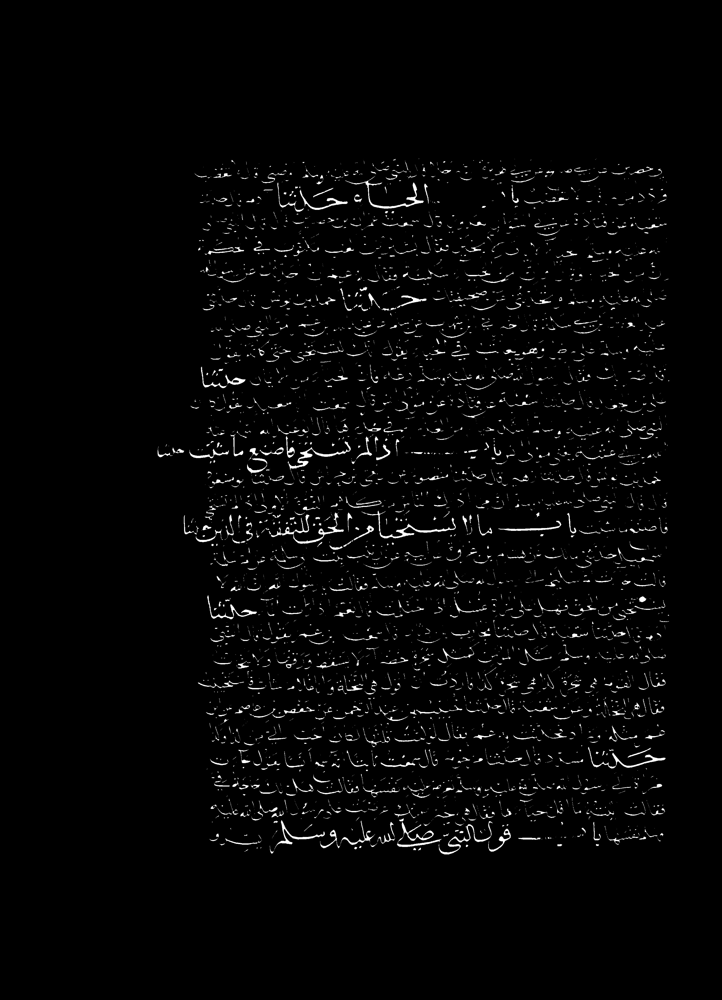

In [ ]:
kernel = np.ones((5, 5))
er = cv.erode(thresh, kernel, iterations = 1)


Edge Detection

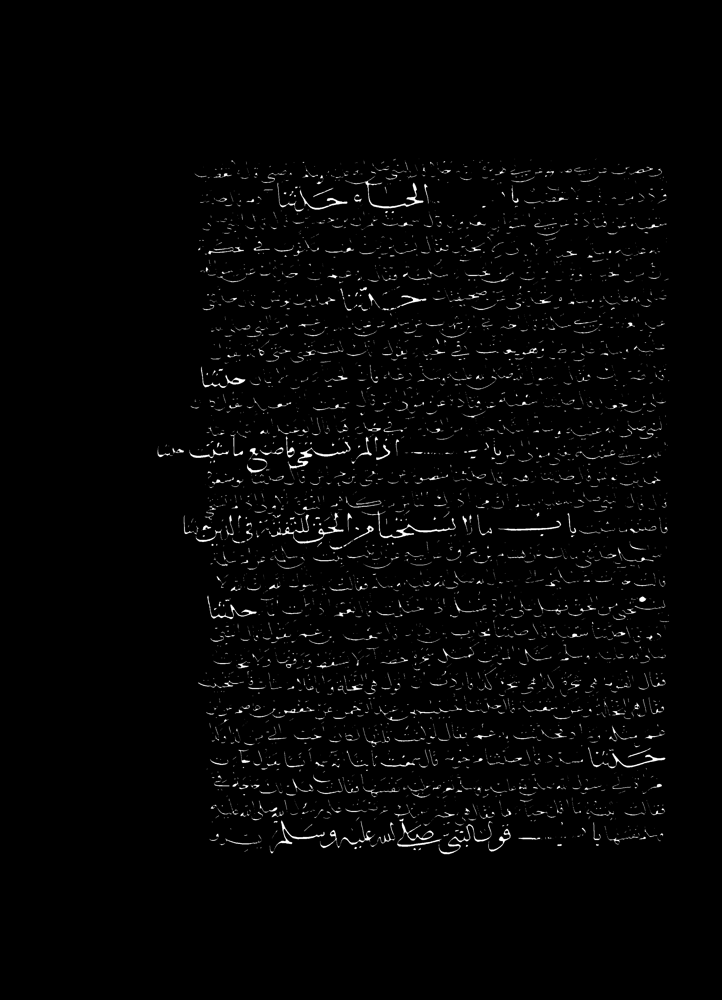

In [ ]:
cany = cv.Canny(er,0,255)
# cv2_imshow(cany)

thresh =er-cany
# cv2_imshow(thresh)
cv2_imshow(thresh)

Smoothing

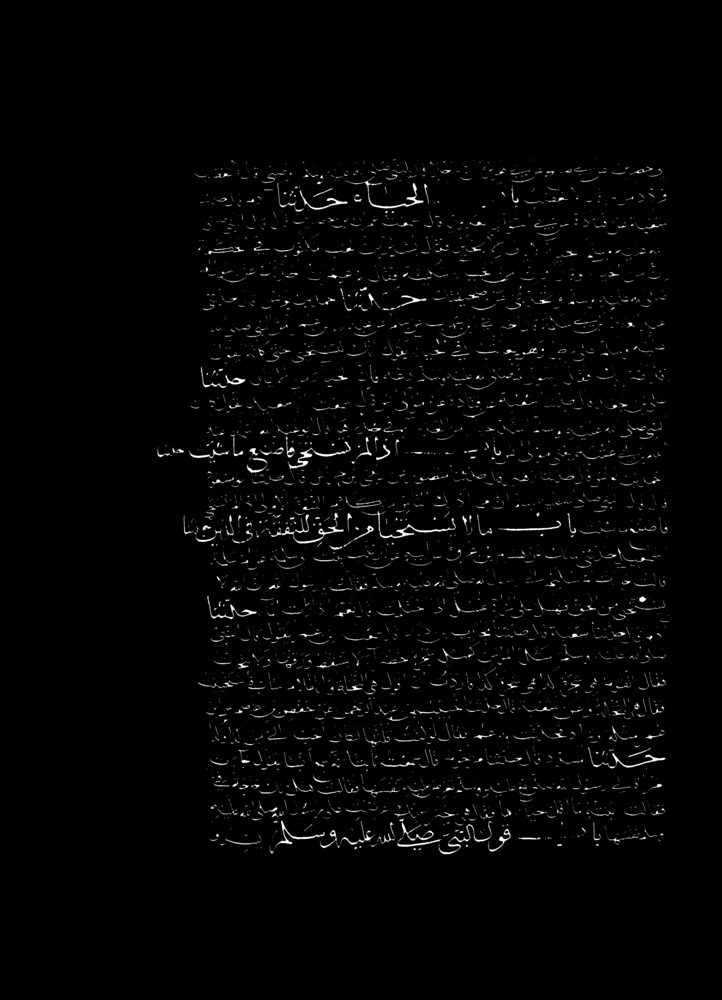

In [ ]:
thresh = cv.GaussianBlur(thresh, (5, 5), 0)
# cv2_imshow(thresh)

Horizontal Projection

In [ ]:
hp = cv.reduce(thresh, 1, cv.REDUCE_AVG).reshape(-1)

Extracting Lines

28


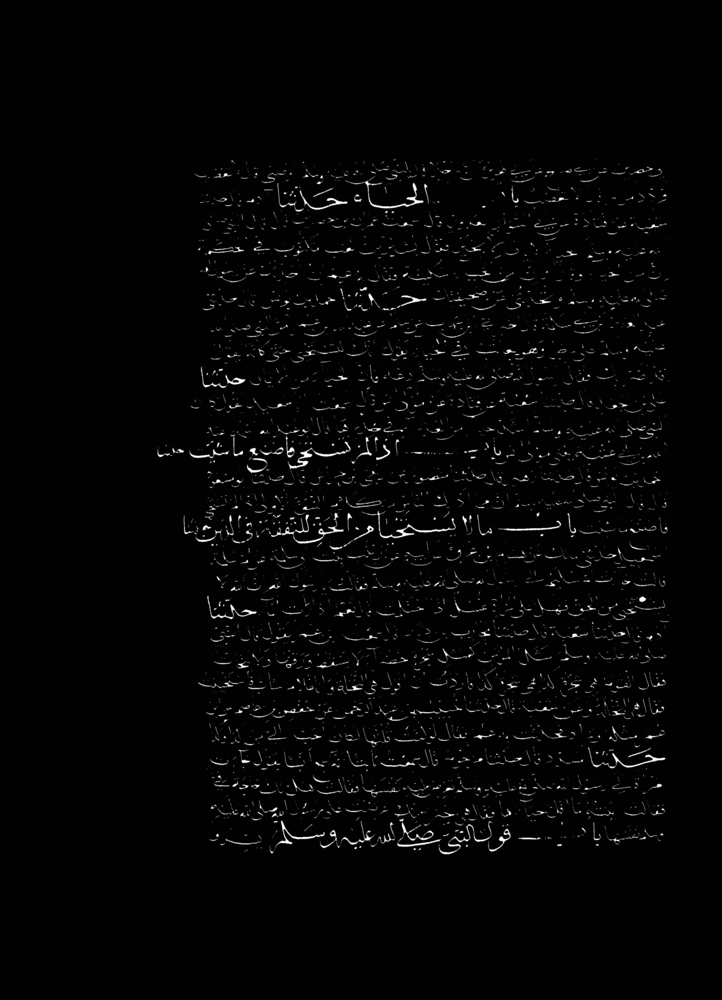

In [ ]:
# Exctract upper and lower bounds of connected lines of the document
th = 2
H,W = thresh.shape[:2]
uppers = [y for y in range(H-1) if hp[y]<=th and hp[y+1]>th]
lowers = [y for y in range(H-1) if hp[y]>th and hp[y+1]<=th]

# Compute lines' heights
lh = [lowers[i] - uppers[i] for i in range(len(lowers))]

# Extract lines with very small heights (i.e.: diacritical lines)
q1 = np.average(lh) / 3
small = [i for i in range(len(lh)) if lh[i] <= q1]

# Filter out small lines
for i in range(len(small)):
  uppers.pop(small[i] - i)
  lowers.pop(small[i] - i)

# Compute lines' heights again without the small lines
lh = [lowers[i] - uppers[i] for i in range(len(lowers))]

# Extract lines with very large heights (i.e.: two connected lines)
q3 = int(np.average(lh) * 1.8)
big = [i for i in range(len(lh)) if lh[i] >= q3]

# Separate large lines into two
for i in range(len(big)):
  mid = uppers[big[i]] + int((lowers[big[i]] - uppers[big[i]]) / 2)
  uppers.append(mid - 2)
  lowers.append(mid + 2)

print(len(uppers))

colored = cv.cvtColor(thresh, cv.COLOR_GRAY2BGR)
for y in uppers:
    cv.line(colored, (0,y), (W, y), (255,0,0), 1)

for y in lowers:
    cv.line(colored, (0,y), (W, y), (0,255,0), 1)

thresh2 = cv.cvtColor(thresh, cv.COLOR_GRAY2BGR)
cv2_imshow(thresh2)


Main Result


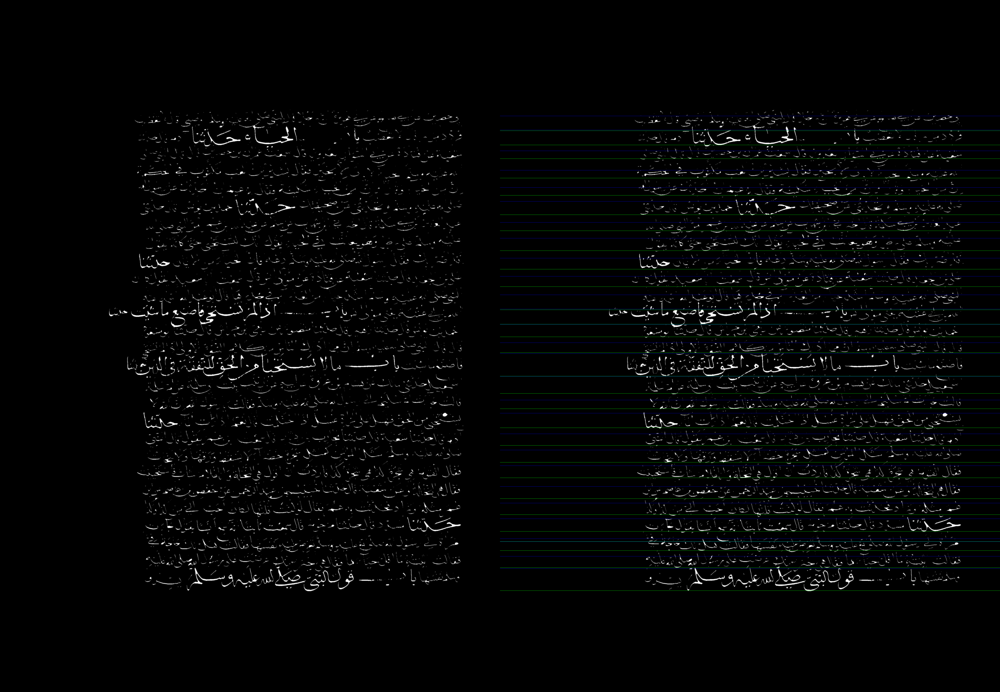

In [ ]:
himg = cv.hconcat((thresh2, colored))
cv2_imshow(himg)

Another Example

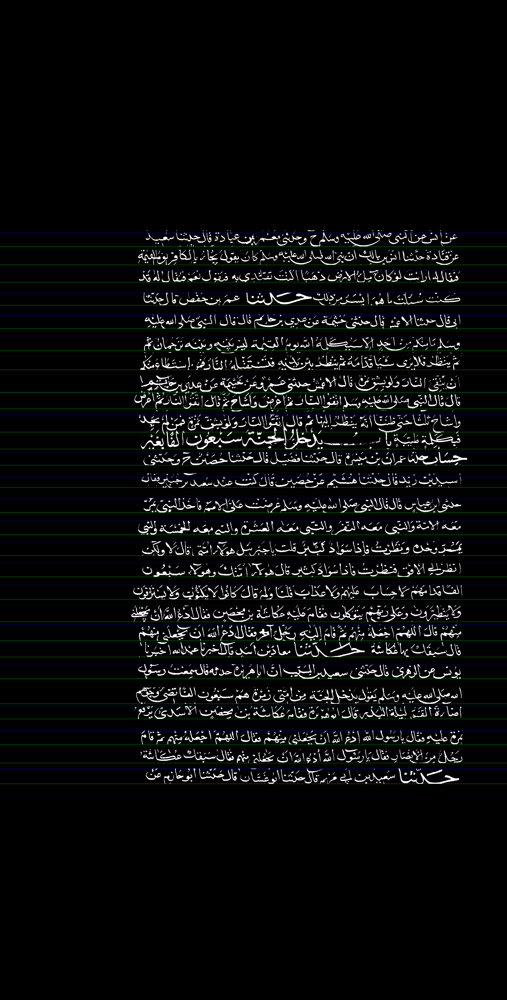

In [ ]:
FILE_NAME = '/content/drive/MyDrive/120 - 2nd Semester/Computer Vision/Project #1/Dataset/ahte_dataset/ahte_test_binary_images/book1_page11.png'

image = cv.imread(FILE_NAME)
h, w = image.shape[:2]
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

# Sum white pixels in each row
# Create blank space array and and final image 
pixels = np.sum(thresh, axis=1).tolist()
space = np.ones((1, w), dtype=np.uint8) * 255
result = np.zeros((0, w), dtype=np.uint8)

# Iterate through each row and add space if entire row is empty
# otherwise add original section of image to final image
for index, value in enumerate(pixels):
    if value <40000:
        result = np.concatenate((result, space), axis=0)
    row = gray[index:index+1, 0:w]
    result = np.concatenate((result, row), axis=0)

thresh = threshold(result, True)

kernel = np.ones((2, 3), np.uint8)
eruded = cv.erode(thresh, kernel, iterations=1)


# Closing
kernel = np.ones((40,2),np.uint8)
closing = cv.morphologyEx(eruded, cv.MORPH_CLOSE, kernel)


thresh = eruded.copy()


# Horizontal Projection
hp = cv.reduce(thresh, 1, cv.REDUCE_AVG).reshape(-1)

# Exctract upper and lower bounds of connected lines of the document
th = 2
H,W = thresh.shape[:2]
uppers = [y for y in range(H-1) if hp[y]<=th and hp[y+1]>th]
lowers = [y for y in range(H-1) if hp[y]>th and hp[y+1]<=th]

# Compute lines' heights
lh = [lowers[i] - uppers[i] for i in range(len(lowers))]

# Extract lines with very small heights (i.e.: diacritical lines)
q1 = np.average(lh) / 3
small = [i for i in range(len(lh)) if lh[i] <= q1]

# Filter out small lines
for i in range(len(small)):
  uppers.pop(small[i] - i)
  lowers.pop(small[i] - i)

# Compute lines' heights again without the small lines
lh = [lowers[i] - uppers[i] for i in range(len(lowers))]

# Extract lines with very large heights (i.e.: two connected lines)
q3 = int(np.average(lh) * 1.8)
big = [i for i in range(len(lh)) if lh[i] >= q3]

# Separate large lines into two
for i in range(len(big)):
  mid = uppers[big[i]] + int((lowers[big[i]] - uppers[big[i]]) / 2)
  uppers.append(mid - 2)
  lowers.append(mid + 2)

colored = cv.cvtColor(thresh, cv.COLOR_GRAY2BGR)

for y in uppers:
    cv.line(colored, (0,y), (W, y), (255,0,0), 1)

for y in lowers:
    cv.line(colored, (0,y), (W, y), (0,255,0), 1)

thresh2 = cv.cvtColor(thresh, cv.COLOR_GRAY2BGR)


himg = cv.hconcat((thresh2, colored))
cv2_imshow(colored)

# Second Approach: Horizontal Projection with Enhacements

Read Sample Image

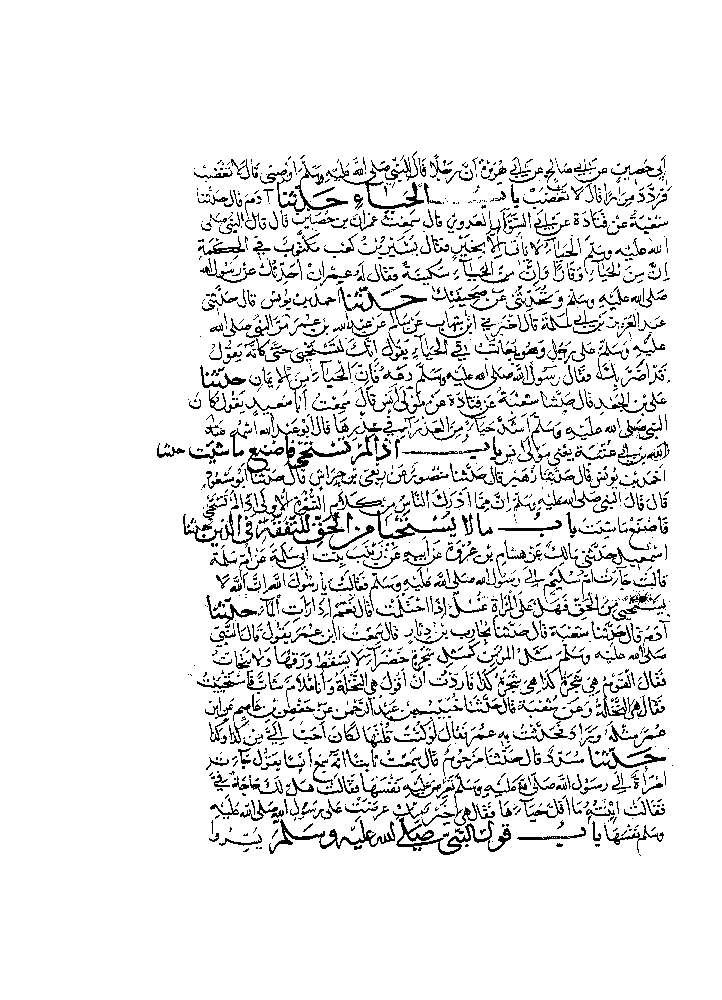

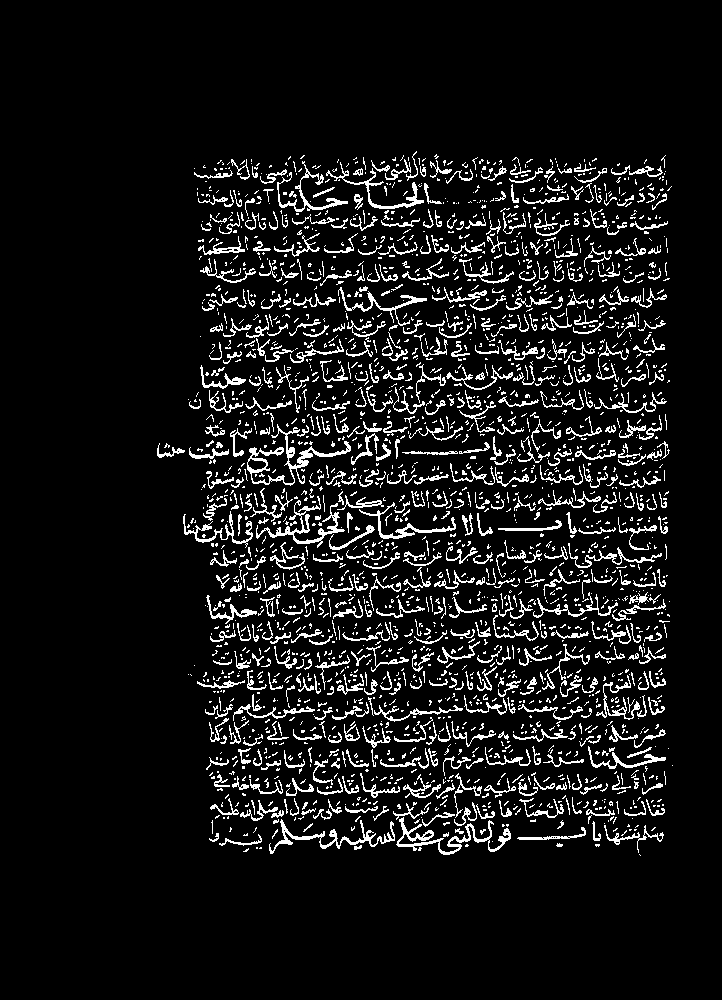

In [ ]:
FILE_NAME = '/content/drive/MyDrive/120 - 2nd Semester/Computer Vision/Project #1/Dataset/ahte_dataset/ahte_test_binary_images/moc_train_3.png'
image = cv.imread(FILE_NAME, cv.IMREAD_GRAYSCALE)
image_org = cv.imread(FILE_NAME)
cv2_imshow(image_org)
ret, image = cv.threshold(image, 0, 255, cv.THRESH_BINARY_INV + cv.THRESH_OTSU)
cv2_imshow(image)


Crop Image


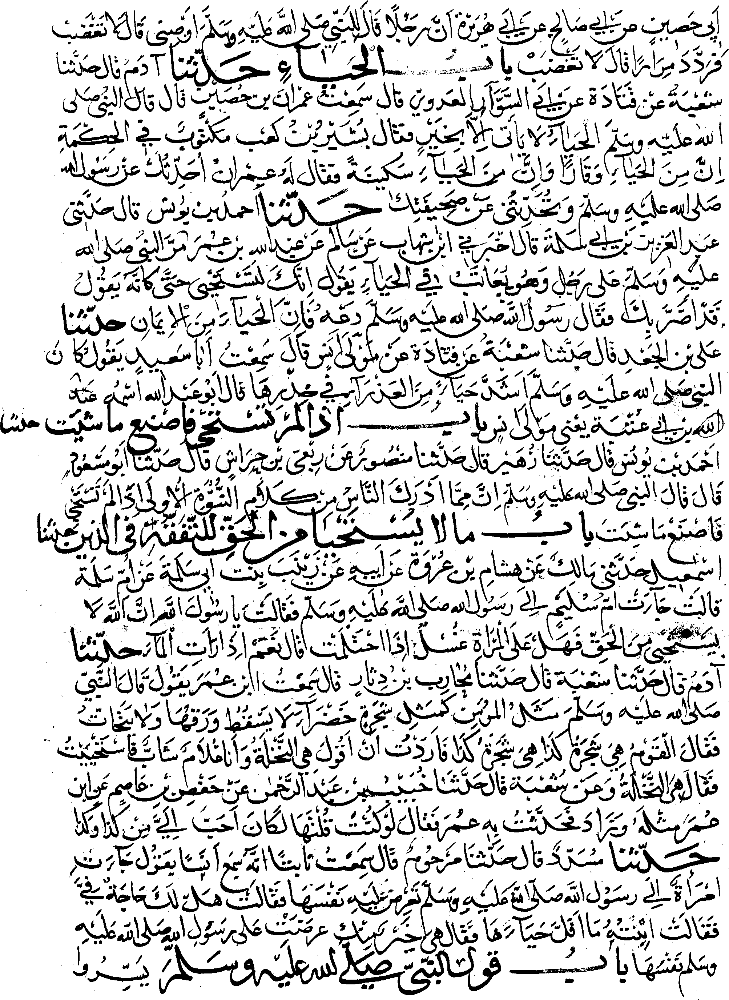

In [ ]:
cropped = crop_image(image_org)
cv2_imshow(cropped)


Fix Line Orientation

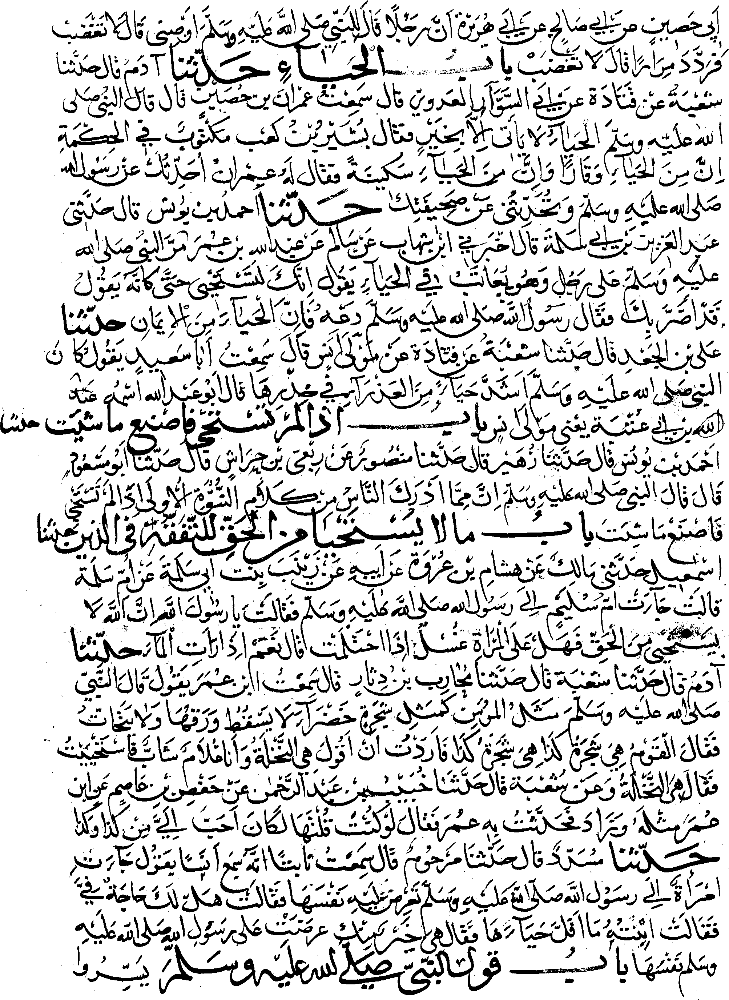

In [ ]:
fixed = fix_skew2(cropped)
cv2_imshow(fixed)


Seam Carving

In [ ]:
# src = np.array(fixed)
# src_h, src_w = src.shape[:2]
# dst = seam_carving.resize(
#     src, (src_w, src_h + 700),
#     energy_mode='forward',   # Choose from {backward, forward}
#     order='height-first',  # Choose from {width-first, height-first}
#     keep_mask=None
# )
# Image.fromarray(dst).show()

# cv2_imshow(dst)

Save Seam Carved Image (For Processing Purposes)

In [ ]:
# FILE_NAME = '/content/drive/MyDrive/120 - 2nd Semester/Computer Vision/Project #1/Dataset/seam_carving/moc_test_10_seam.png'
# cv2.imwrite (FILE_NAME, dst)

Load image, convert to grayscale, Gaussian blur, Otsu's threshold

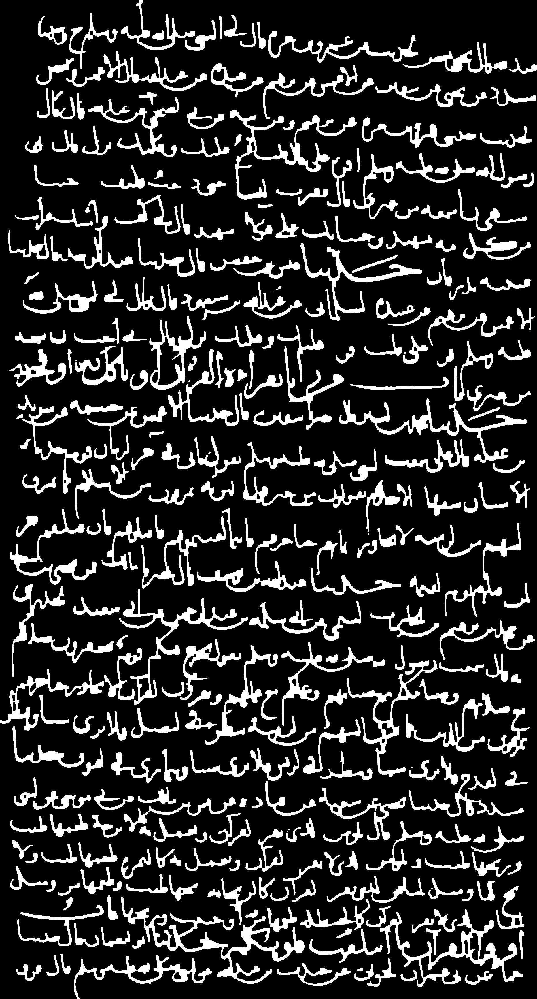

In [ ]:
FILE_NAME = '/content/drive/MyDrive/120 - 2nd Semester/Computer Vision/Project #1/Dataset/seam_carving/moc_test_10_seam.png'
image = cv.imread(FILE_NAME) 


# gray = cv.cvtColor(image, cv.COLOR_RGB2GRAY)

# blur = cv2.GaussianBlur(gray, (3,3), 0)
# thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
cv2_imshow(thresh)


Filter using contour area and remove small noise

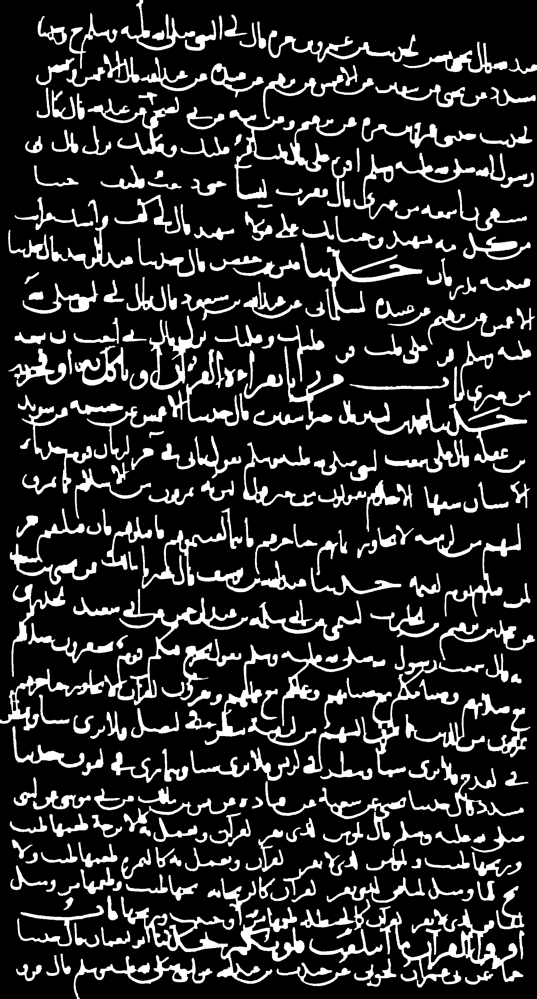

In [ ]:
cnts = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
for c in cnts:
    area = cv2.contourArea(c)
    if area < 400:
        cv2.drawContours(thresh, [c], -1, (0,0,0), -1)

cv2_imshow(thresh)

Morph close and invert image

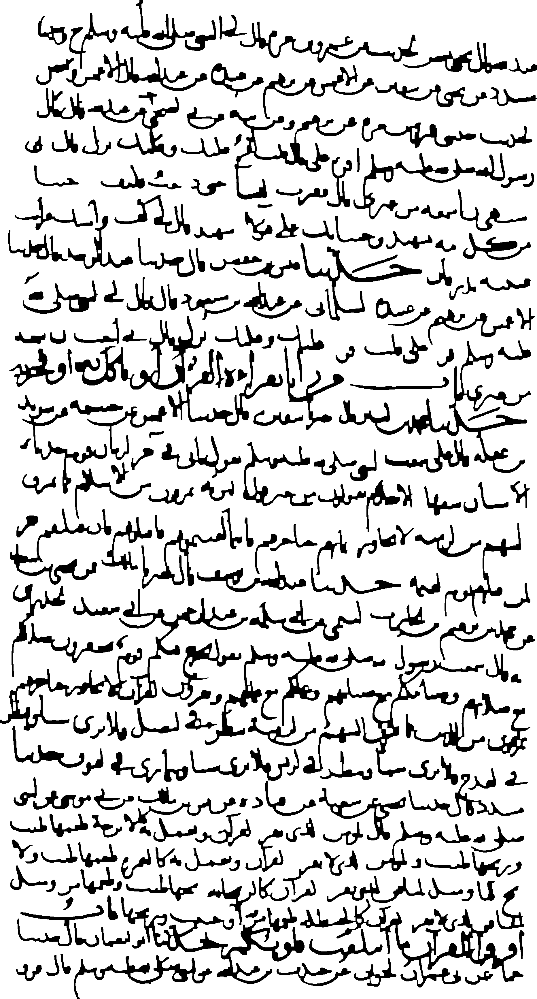

In [ ]:
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))
close = 255 - cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=2)

cv2_imshow(close)

Thresholding, Erusion and Dilation

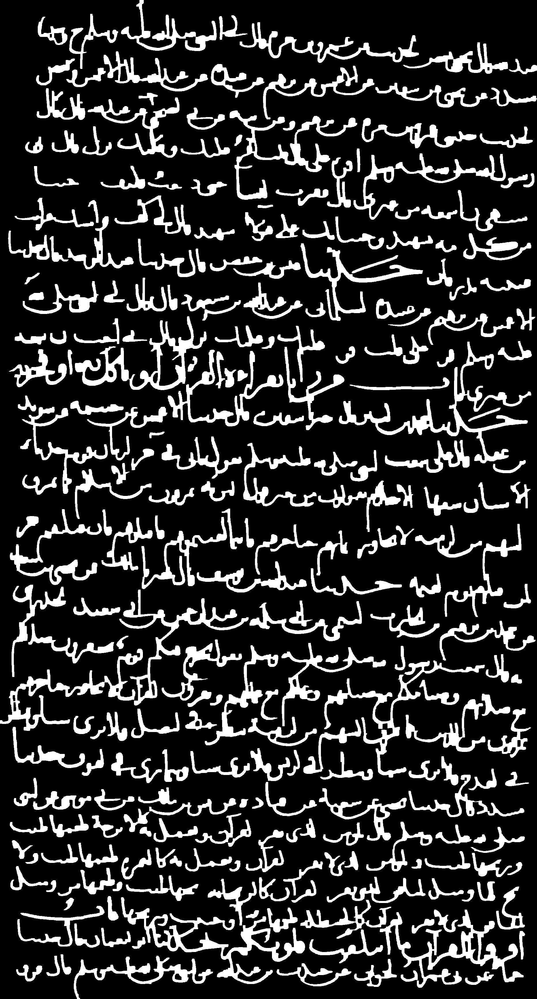

In [ ]:
fixed = cv2.threshold(close, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

# Erosion
kernel = np.ones((2, 2))
thresh = cv.erode(fixed, kernel, iterations = 2)

# dilate
kernel = np.ones((2, 5))
thresh = cv.dilate(thresh, kernel, iterations = 1)

cv2_imshow(thresh)

Split Image into Sub-Columns

In [ ]:
ALL_LINES = []

img = thresh.copy()
nCols = 5 
nRows = 1

number_of_sub_images = 40

sub_images = []
sub_images_org = []

sizeX = img.shape[1]
sizeY = img.shape[0]
col_width = int(sizeX/number_of_sub_images)

for i in range(0, number_of_sub_images):
  col_index = i
  sub_image = img[0:sizeY, (col_index * col_width) : ((col_index + 1) * col_width)]
  sub_images.append(sub_image)
  # cv2_imshow(sub_image)
for i in range(0, number_of_sub_images):
  col_index = i
  sub_image = image[0:sizeY, (col_index * col_width) : ((col_index + 1) * col_width)]
  sub_images_org.append(sub_image)



Operations on each sub-column: fix skew, Erosion, thresholding, drawing white lines, thresholding and drawing upper and lower lines

In [ ]:
result = []
result_org = []

for sub_image_index in range(0, len(sub_images)):
  img = sub_images[sub_image_index].copy()
  
  # Fix Skew
  img = fix_skew(img)
  
  # Erosion
  kernel = np.ones((2, 3))
  img = cv.erode(img, kernel, iterations = 1)

  # Thresholding
  img = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

  # Draw White Lines
  img = draw_white_space_between_lines(img, 0, 100, False)

  # Thresholding
  img = threshold(img, True)

  # Draw Upper and Lower Lines
  res, res_org = draw_lines(img, sub_images_org[sub_image_index]) 
  
  result.append(res)
  result_org.append(res_org)


Concatinating Sub-Images

In [ ]:
himg = result[0]

for image_index in range(1, len(result)):
  himg = cv.hconcat((himg, result[image_index]))


himg_org = result_org[0]

for image_index in range(1, len(result_org)):
  himg_org = cv.hconcat((himg_org, result_org[image_index]))

Main Result

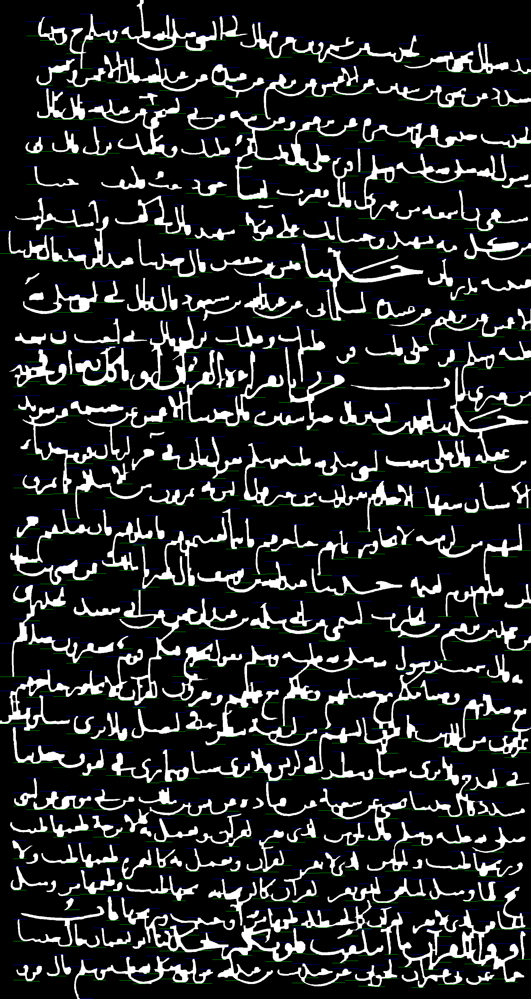

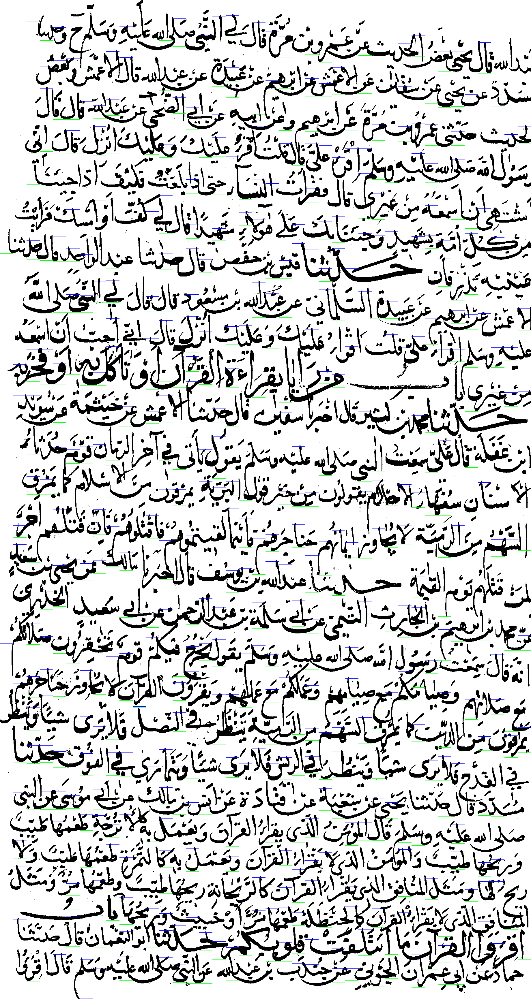

In [ ]:
cv2_imshow(himg)

cv2_imshow(himg_org)

# Third Approach: Connected Components

here we will use **connected components** approach to analyize the lines in the images 

first,
*   **used method**: add white spaces between lines





In [ ]:
def draw_white_space_between_lines(image, threshold_value_low=40000, threshold_value_high=40000, plot_histogram=False):
  # FILE_NAME = '/content/drive/MyDrive/120 - 2nd Semester/Computer Vision/Project #1/Dataset/ahte_dataset/ahte_test_binary_images/book1_page11.png'
  # image = cv.imread(FILE_NAME)
  h, w = image.shape[:2]
  # gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  gray = image.copy()
  thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

  # Sum white pixels in each row
  # Create blank space array and and final image 
  pixels = np.sum(thresh, axis=1).tolist()
  space = np.ones((1, w), dtype=np.uint8) * 255
  result = np.zeros((0, w), dtype=np.uint8)

  # Iterate through each row and add space if entire row is empty
  # otherwise add original section of image to final image
  for index, value in enumerate(pixels):
      if value > threshold_value_low and  value < threshold_value_high:
        # cv.line(colored, (0,uppers[line_index]), (W, uppers[line_index]), (255,0,0), 1)
        result = np.concatenate((result, space), axis=0)
        # result = np.concatenate((result, space), axis=0)
      else:
        row = gray[index:index+1, 0:w]
        result = np.concatenate((result, row), axis=0)

  #  plot visualization
  if (plot_histogram):
    x = range(len(pixels))[::-1]
    df = pd.DataFrame({'y': x, 'x': pixels})
    df.plot(x='x', y='y', xlim=(-2000,max(pixels) + 2000), legend=None, color='teal',figsize=(20,40))

  # result = cv.threshold(result,0,255,cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

  return result


*   **Preprocessing** 

**read image and thresholding + closing-0** 

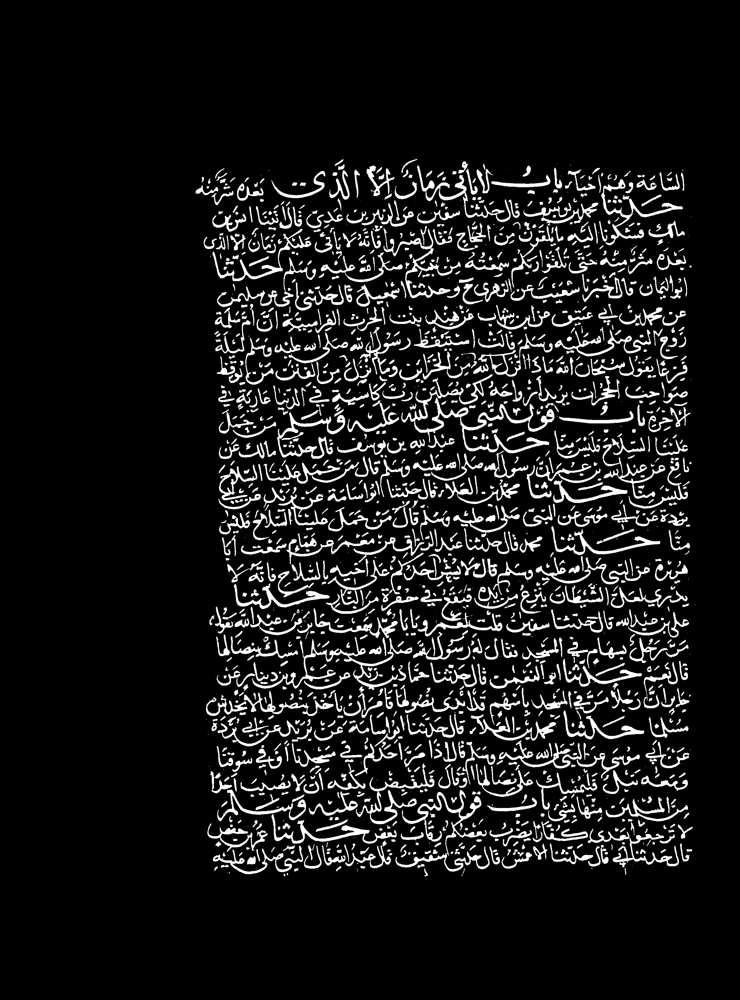

In [ ]:
FILE_NAME = '/content/drive/MyDrive/Dataset/ahte_dataset/ahte_test_binary_images/moc_test_5.png'
image = cv.imread(FILE_NAME)

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray, 0, 255,
	cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]

kernel = cv.getStructuringElement(cv.MORPH_RECT,(5,3))
thresh = cv2.morphologyEx(thresh,cv.MORPH_CLOSE,kernel)
# thresh = cv2.morphologyEx(thresh,cv.MORPH_CLOSE,kernel)

cv2_imshow(thresh)

**erossion-0** : reduce overlapping

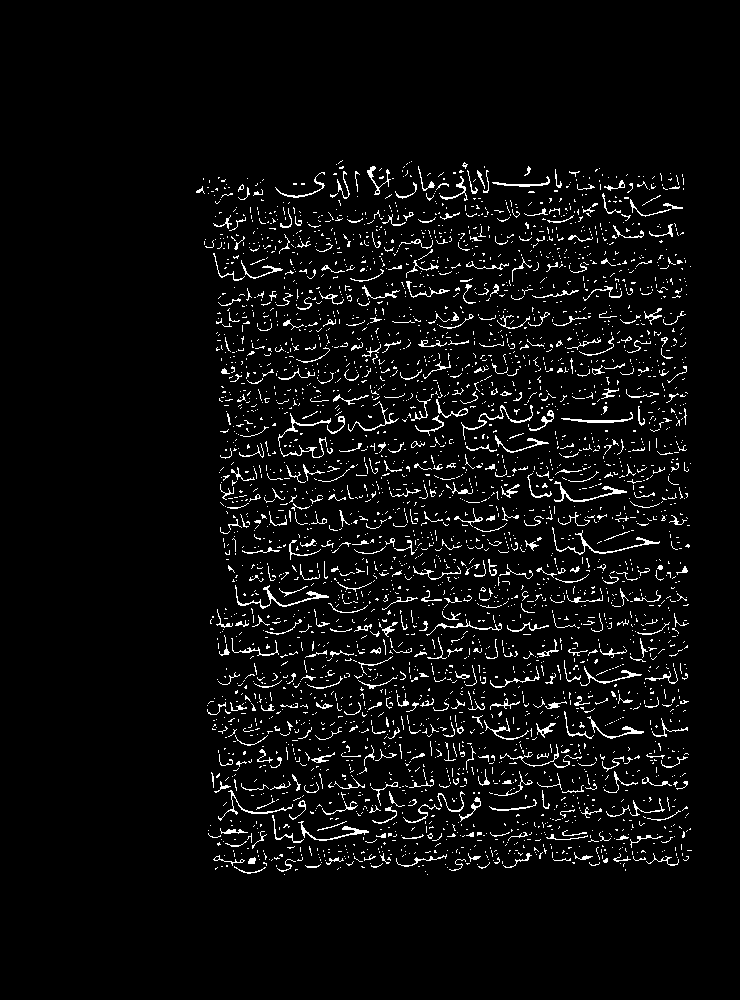

In [ ]:
kernel = np.ones((3,2),np.uint8)
erosion = cv.erode(thresh,kernel,iterations = 2)
cv2_imshow(erosion)

**Closing-1** : reconnect words togather again 

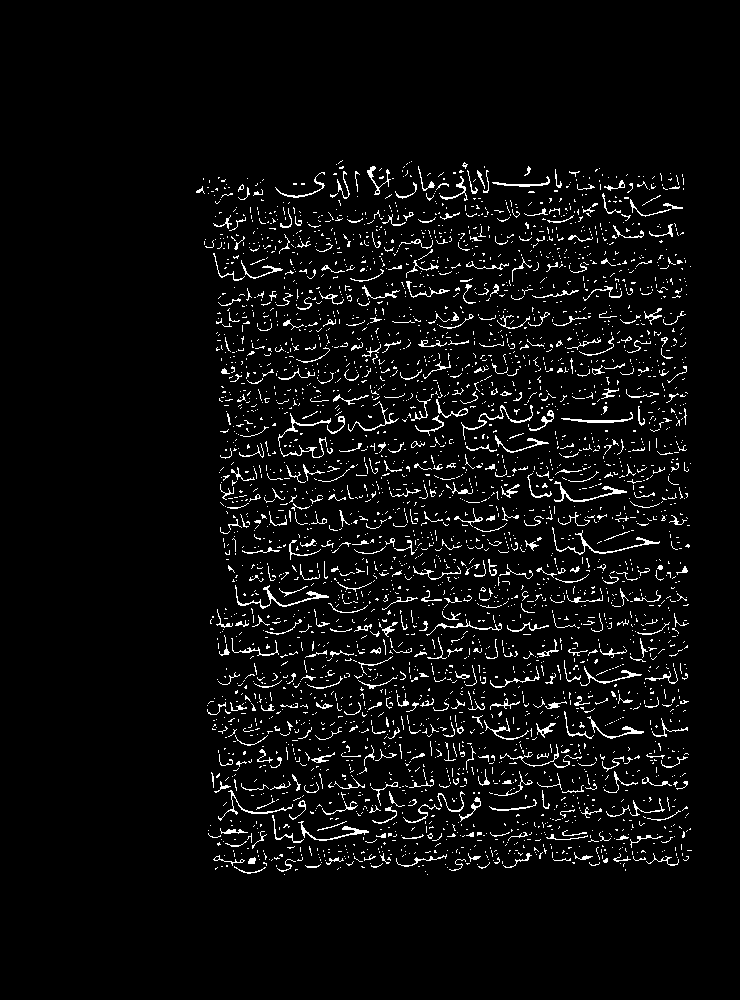

In [ ]:
kernel=cv.getStructuringElement(cv.MORPH_RECT,(3,3))
closing = cv.morphologyEx(erosion, cv.MORPH_CLOSE, kernel)
cv2_imshow(closing)

**Thining** : reduce overlapping more and more between lines by removing the edges from the precious output 3 times 

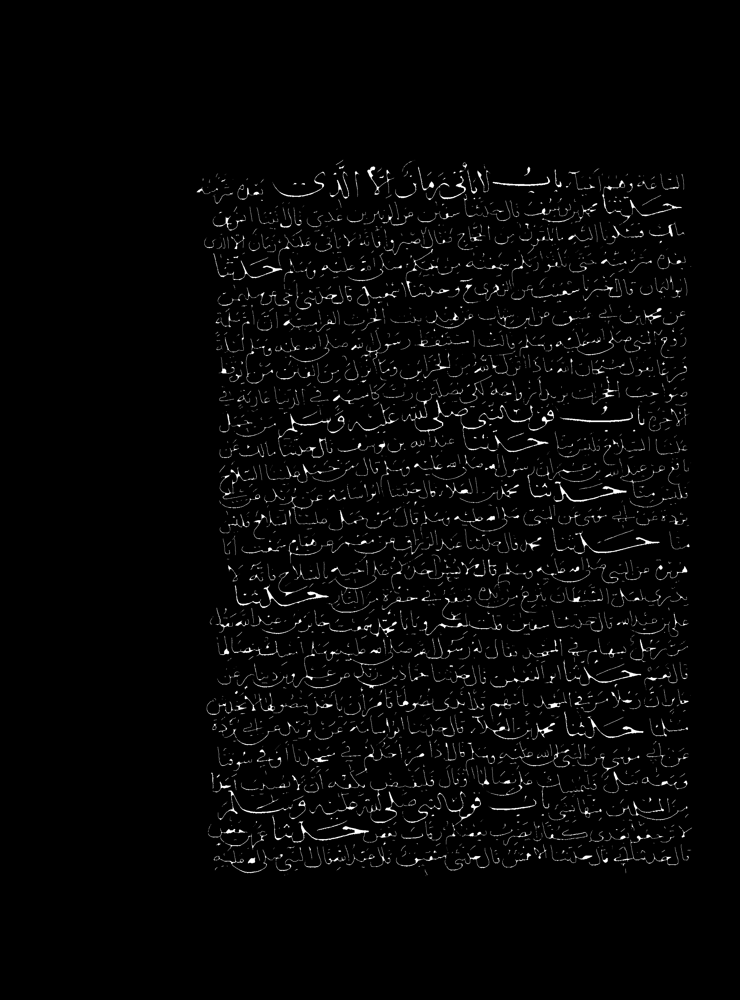

In [ ]:
out = closing
for i in range(0,3):
  canny = cv.Canny(out,0,255)
  out = out - canny 

cv2_imshow(out)

**increase space between lines** : here we increase the space between lines to avoid over lapping

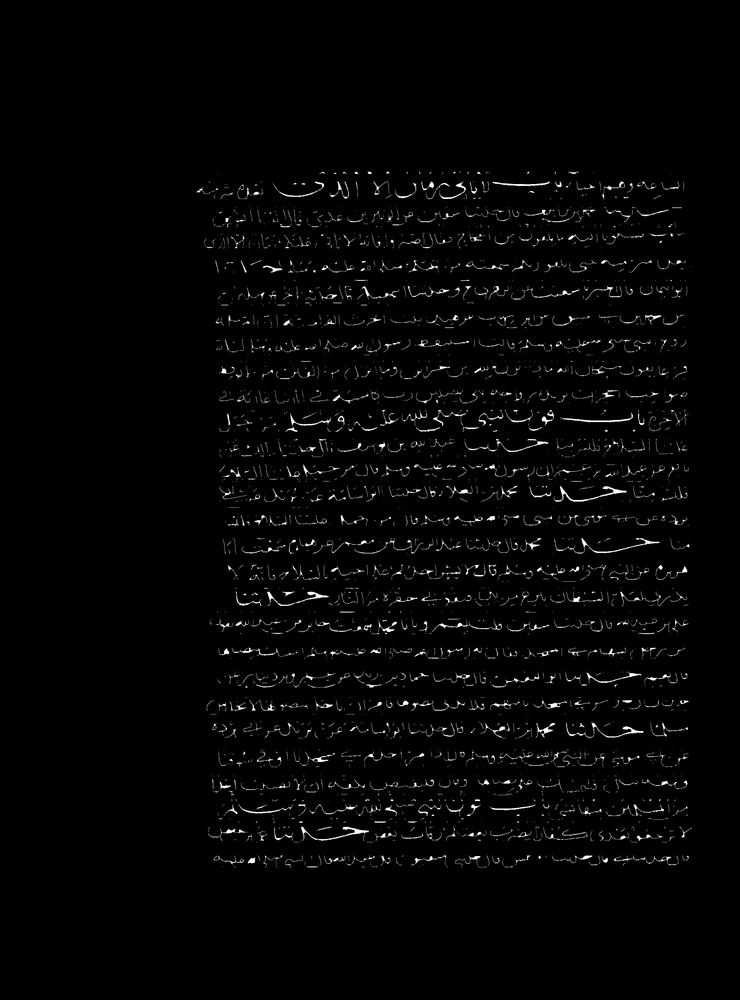

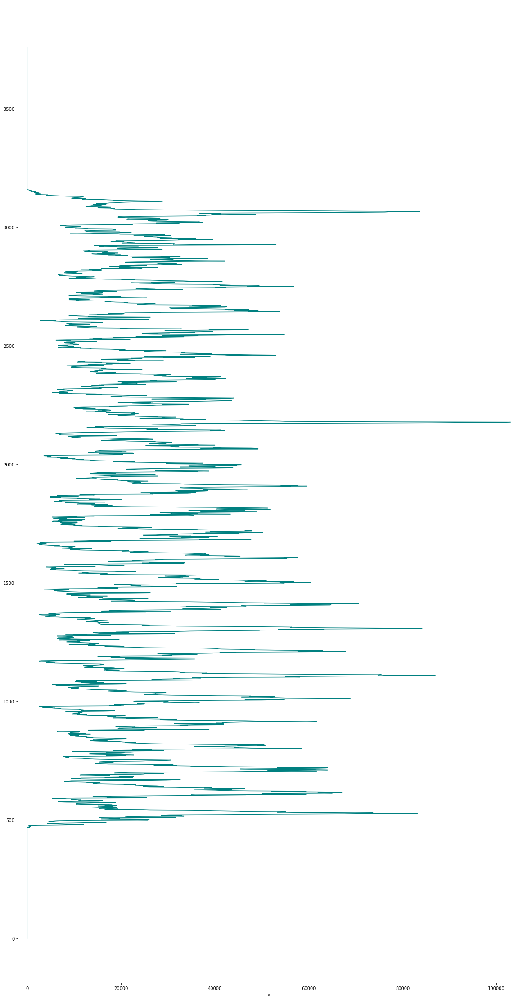

In [ ]:
out_inv = cv2.threshold(out, 0, 255,	cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
# cv2_imshow(out_inv)
out1 = draw_white_space_between_lines(out_inv,0,20000,True)
out1 =cv2.threshold(out1, 0, 255,	cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
cv2_imshow(out1)

**dilation-0** : first dilation to make the line smother and look like connected component 

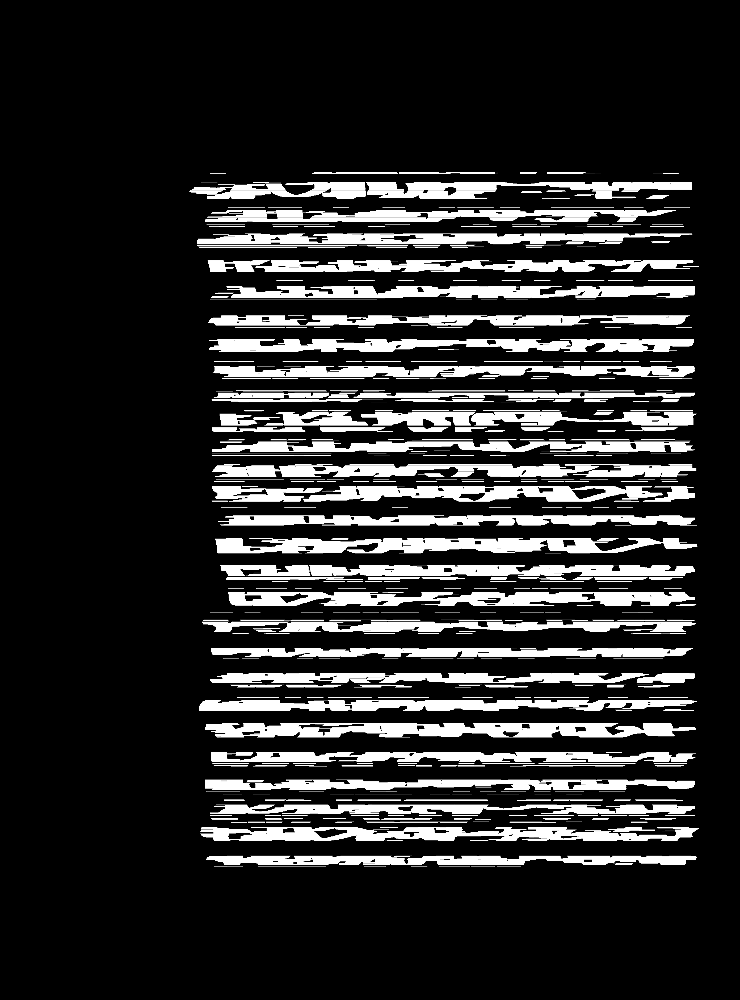

In [ ]:
kernel=cv.getStructuringElement(cv.MORPH_RECT,(60,1))

dilation1 = cv.dilate(out1,kernel,iterations=1)
cv2_imshow(dilation1)

**errosion-1** : clean the image from noise happend from dillation between lines 

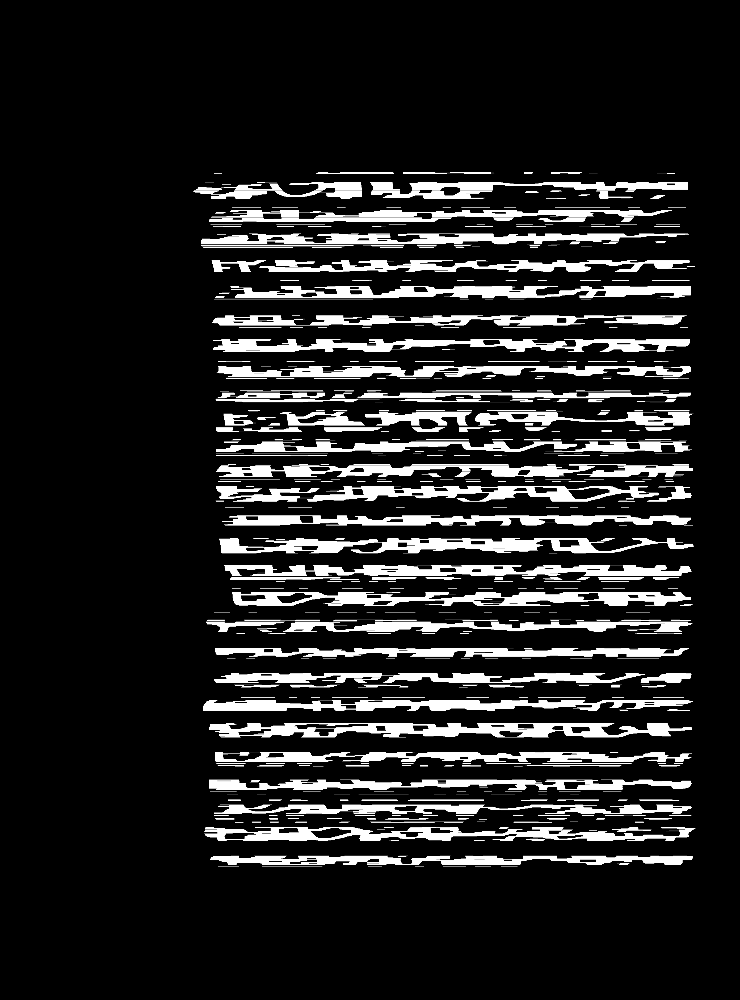

In [ ]:
kernel=cv.getStructuringElement(cv.MORPH_RECT,(30,1))

erosion1 = cv.erode(dilation1,kernel,iterations=1)
cv2_imshow(erosion1)

**increase space between lines** : here , we increase the space between connected component to have indviduals componnents 

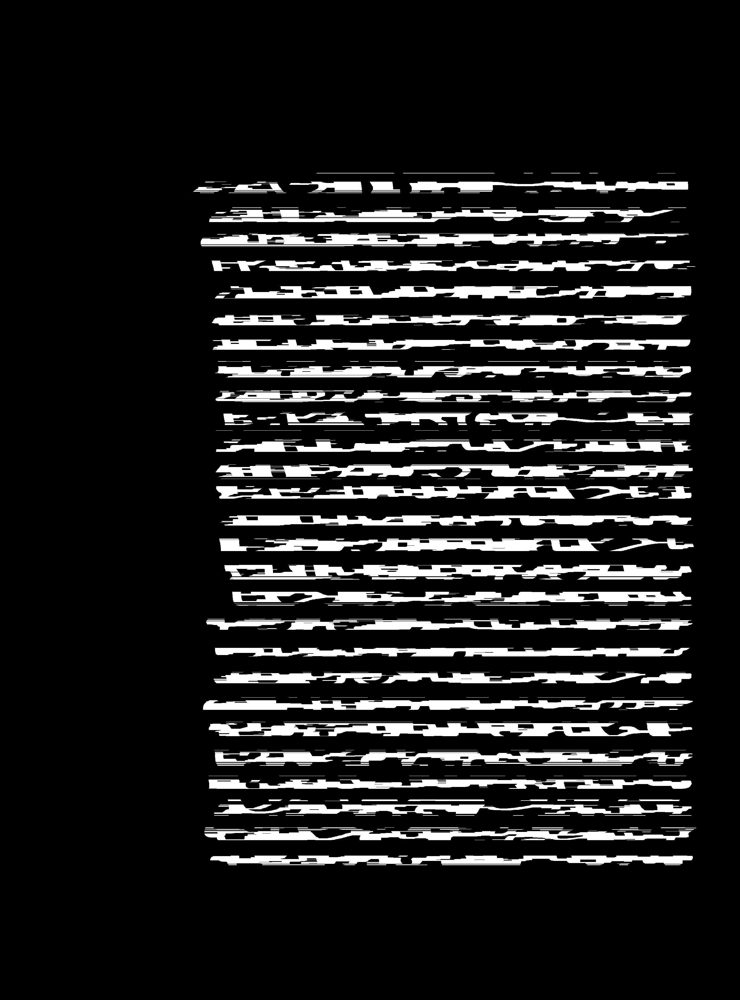

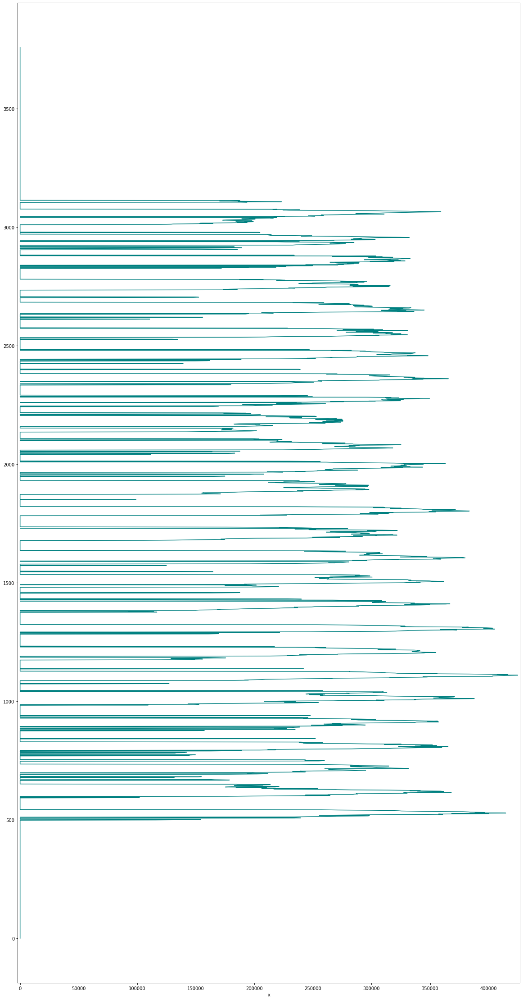

In [ ]:
erosion1_inv = cv2.threshold(erosion1, 0, 255,	cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
out2 = draw_white_space_between_lines(erosion1_inv,0,200000,True)
out2 =cv2.threshold(out2, 0, 255,	cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
cv2_imshow(out2)

**dilation-1** : make the connected components smother and more connected 

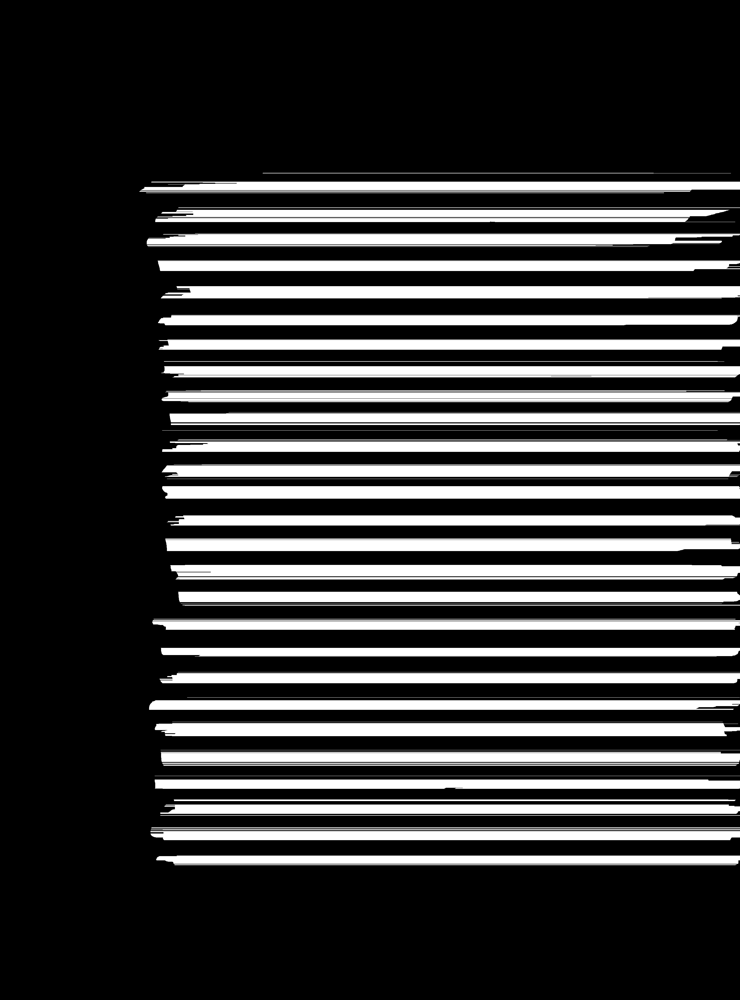

In [ ]:
kernel=cv.getStructuringElement(cv.MORPH_RECT,(60,1))
dilation3 = cv.dilate(out2,kernel,iterations=7)

cv2_imshow(dilation3)

In [ ]:
preproc = dilation3



*   **connected component algorithm**


**applay preproccesed image to connected componnent method**: after that , we will get an output with stats of each analyized connected componnent 

In [ ]:
image_copy = image
output = cv2.connectedComponentsWithStats(preproc, connectivity=4)
(numLabels, labels, stats, centroids) = output

**draw rectangels on Lines** : here from the stats given from 

```
# cv2.connectedComponentsWithStats
```
we draw the rectangale over the lines.



*also we have to mention that we filltered small connected componnents by hight, small hights means unneeded connected componnents*

> the question here what is the threshold for hight ??

> by printing the hights we saw that most of needed hights are larger that 20






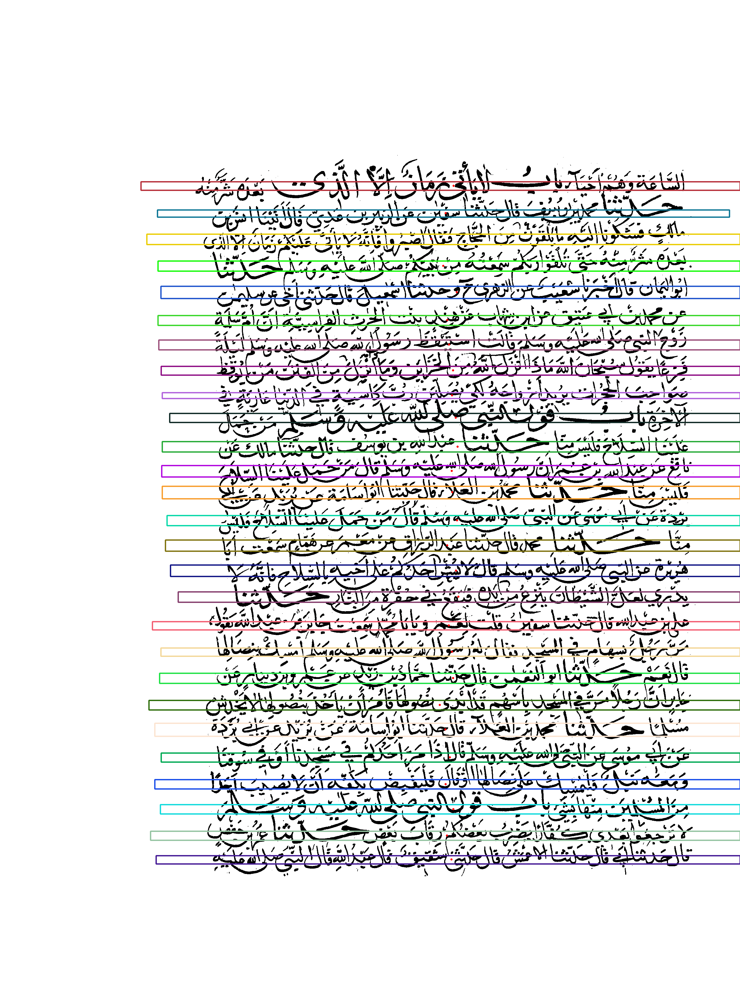

In [ ]:
image_copy = image.copy()
h_low =  20

for i in range(1,numLabels):
  R = (random.random() * 1000) % 256 
  G = (random.random() * 1000) % 256 
  B= (random.random() * 1000) % 256 
  w = stats[i , cv.CC_STAT_WIDTH]
  h = stats[i , cv.CC_STAT_HEIGHT]
  area = stats[i , cv.CC_STAT_AREA]
  x = stats[i , cv.CC_STAT_LEFT]
  y = stats[i , cv.CC_STAT_TOP]  
  (cX , cY) = centroids[i]
  if ( h > h_low):
    cv2.rectangle(image_copy, (x,y) , (x + w , y + h ), (R,G,B),3)
    cv2.circle(image_copy,(int(cX),int(cY)),4 , (0,0,255),-1)
cv2_imshow(image_copy)